# Mask R-CNN - Inspect Landsat Trained Model

Code and visualizations to test, debug, and evaluate the Mask R-CNN model.

In [1]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Root directory of the project
ROOT_DIR = os.path.abspath("/mnt/cropmaskperm/results/test-landsat/")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from cropmask.mrcnn import utils, visualize
from cropmask.mrcnn.visualize import display_images
import cropmask.mrcnn.model as modellib
from cropmask.mrcnn.model import log
from cropmask.misc import parse_yaml

from cropmask import model_configs, datasets, preprocess
# preprocess.DATASET to get the dir

%matplotlib inline 

# Directory to save logs and trained model
LOGS_DIR = os.path.join(ROOT_DIR, "logs/landsat-512-cp20190831T0604/")

/data/anaconda/envs/cropmask/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/data/anaconda/envs/cropmask/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/data/anaconda/envs/cropmask/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/data/anaconda/envs/cropmask/lib/python3.7/site-packages/tensorf

In [3]:
# Comment out to reload imported modules if they change
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Configurations

In [15]:
# Inference Configuration
config = model_configs.LandsatInferenceConfig(3)
# config.BACKBONE = "resnet101"
config.display()


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
CHANNELS_NUM                   3
COCO_WEIGHTS_PATH              /home/ryan/work/CropMask_RCNN/models/mask_rcnn_coco.h5
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        400
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              pad64
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.0003
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class

## Notebook Preferences

In [16]:
# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
# check which gpu is being used to train another model with nvidia-smi. use the other gpu for inference
DEVICE = "/cpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# Only inference mode is supported right now
TEST_MODE = "inference"

In [17]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    fig, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    fig.tight_layout()
    return ax

## Load Validation Dataset

In [18]:
from cropmask.misc import parse_yaml

In [19]:
configs = parse_yaml("../test_inspection_config.yaml")

# Load dataset
dataset = datasets.ImageDataset()

# The subset is the name of the sub-directory, such as stage1_train,
# stage1_test, ...etc. You can also use these special values:
#     train: loads stage1_train but excludes validation images
#     val: loads validation images from stage1_train. For a list
#          of validation images see crop_mask.py
dataset.split_imagery(configs['dirs']['dataset'], configs['seed'],.1)
dataset.load_imagery(configs['dirs']['dataset'], subset="test", image_source='landsat-5', class_name="center-pivot")


dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))

Images: 63
Classes: ['BG', 'center-pivot']


## Load Model

In [20]:
# Create model in inference mode
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference",
                              model_dir=LOGS_DIR,
                              config=config)

In [21]:
# Path to a specific weights file

weights_path = os.path.join(LOGS_DIR,"mask_rcnn_landsat-512-cp_0060.h5")
# Or, load the last model you trained
#weights_path = model.find_last()

# Load weights
print("Loading weights ", weights_path)
model.load_weights(weights_path, by_name=True)

Loading weights  /mnt/cropmaskperm/results/test-landsat/logs/landsat-512-cp20190831T0604/mask_rcnn_landsat-512-cp_0060.h5
Re-starting from epoch 60


image ID: landsat-5.LT050290312005031601T1-SC20190818204935_tile_2560_3072 (11) None
Original image shape:  [512 512   3]
Processing 1 images
image                    shape: (512, 512, 3)         min:  484.00000  max: 4021.00000  int16
molded_images            shape: (1, 512, 512, 3)      min:  484.00000  max: 4021.00000  int16
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.70849  max:    1.58325  float32
gt_class_id              shape: (162,)                min:    1.00000  max:    1.00000  int32
gt_bbox                  shape: (162, 4)              min:    0.00000  max:  512.00000  int32
gt_mask                  shape: (512, 512, 162)       min:    0.00000  max:    1.00000  bool
AP @0.50:	 0.111
AP @0.55:	 0.111
AP @0.60:	 0.111
AP @0.65:	 0.111
AP @0.70:	 0.111
AP @0.75:	 0.102
AP @0.80:	 0.078
AP @0.85:	 0.025
AP @0.90:	 0.017
AP @0.95:	 0.001
AP @0.50-0.95:	 0.078


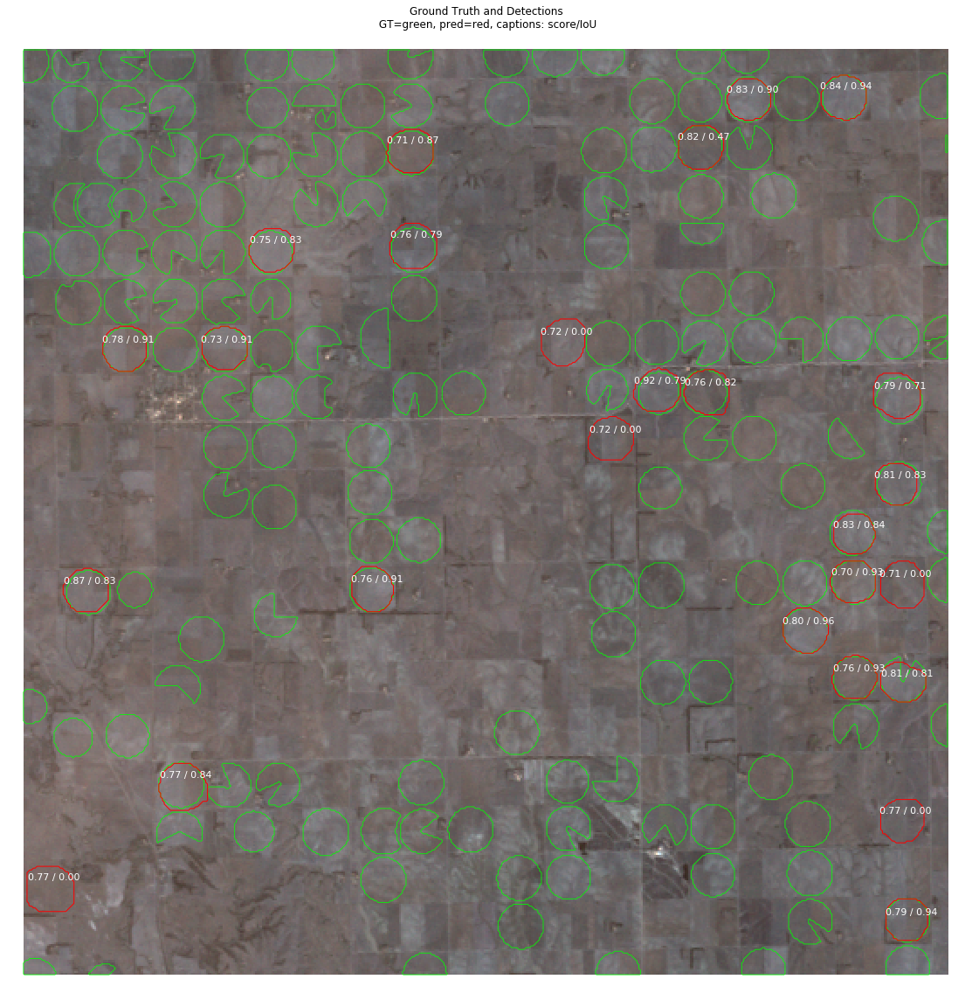

In [22]:
import matplotlib.pyplot as plt
import skimage.io as skio
image_id = 11

image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))
print("Original image shape: ", modellib.parse_image_meta(image_meta[np.newaxis,...])["original_image_shape"][0])

# Run object detection
results = model.detect_molded(np.expand_dims(image, 0), np.expand_dims(image_meta, 0), verbose=1)

if True in gt_mask:
    
    # Display results
    r = results[0]
    log("gt_class_id", gt_class_id)
    log("gt_bbox", gt_bbox)
    log("gt_mask", gt_mask)
    # Compute AP over range 0.5 to 0.95 and print it
    utils.compute_ap_range(gt_bbox, gt_class_id, gt_mask,
                           r['rois'], r['class_ids'], r['scores'], r['masks'],
                           verbose=1)

    visualize.display_differences(
        image,
        gt_bbox, gt_class_id, gt_mask,
        r['rois'], r['class_ids'], r['scores'], r['masks'],
        dataset.class_names, ax=get_ax(),
        show_box=False, show_mask=False,
        iou_threshold=0.5, score_threshold=0.5)
    
else:
    r = results[0]
    print('Should have no predictions if model was accurate')
    i=0
    v_min = image.min(axis=(0, 1), keepdims=True)
    v_max = image.max(axis=(0, 1), keepdims=True)
    image = (image - v_min)/(v_max - v_min)
    skio.imshow(image)
    while i < r['masks'].shape[-1]:
        plt.figure()
        plt.imshow(1*r['masks'][:,:,i])
        i += 1

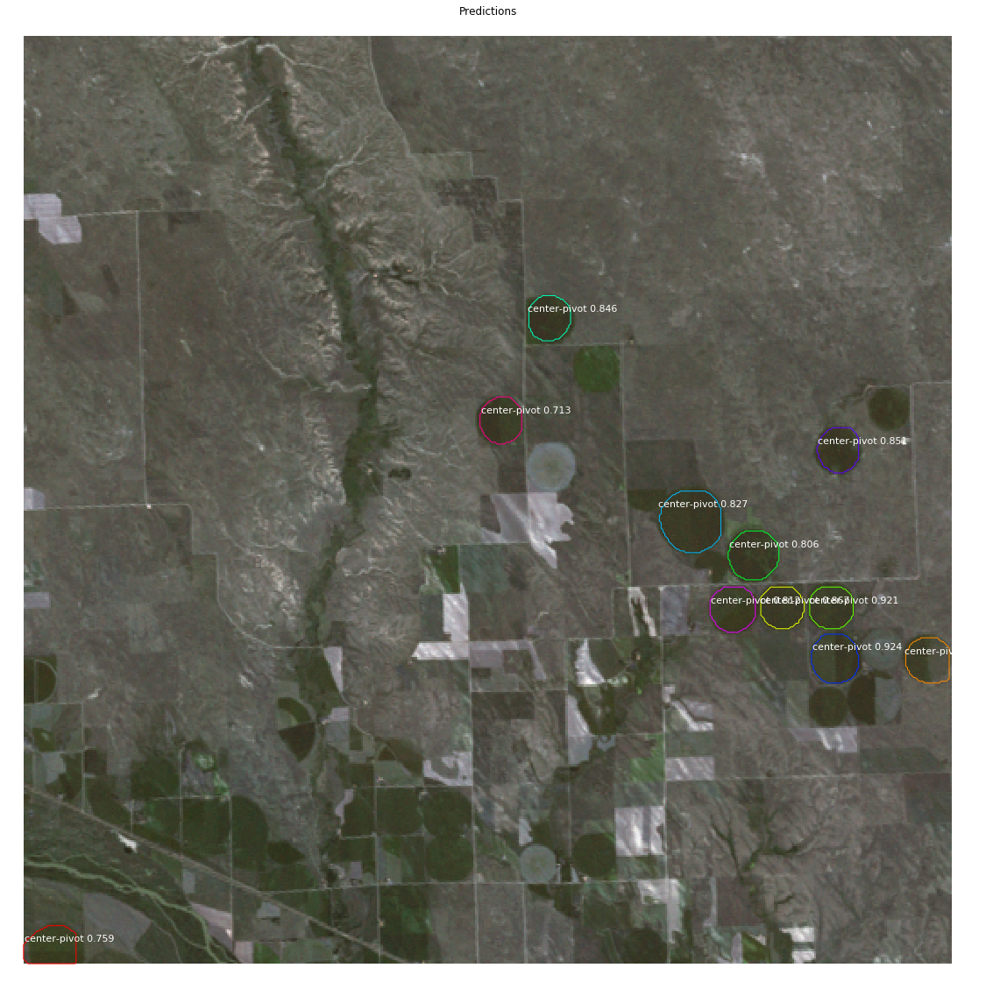

In [11]:
# Display predictions only
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], ax=get_ax(1),
                            show_bbox=False, show_mask=False,
                            title="Predictions")

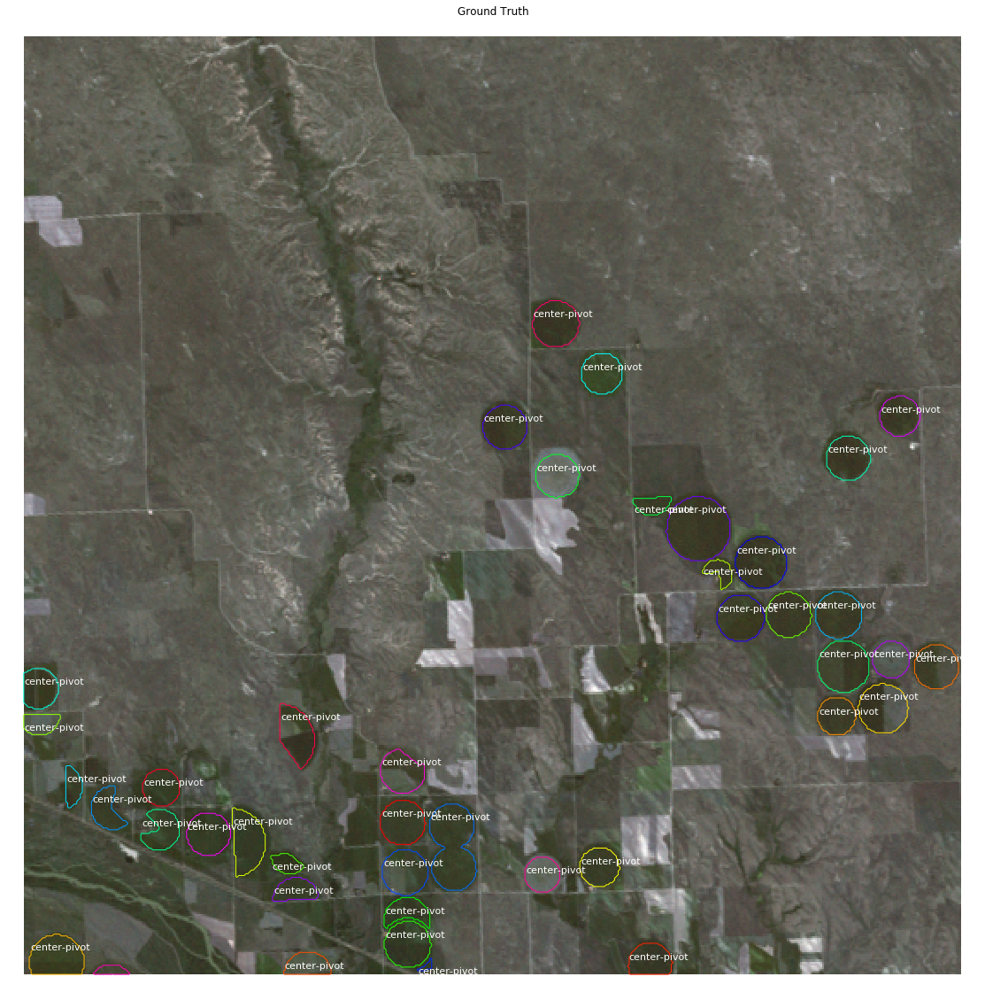

In [12]:
# Display Ground Truth only
visualize.display_instances(image, gt_bbox, gt_mask, gt_class_id, 
                            dataset.class_names, ax=get_ax(1),
                            show_bbox=False, show_mask=False,
                            title="Ground Truth")

### Compute AP on Batch of Images

In [23]:
def compute_batch_ap(dataset, image_ids, verbose=1):
    APs = []
    for image_id in image_ids:
        # Load image
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset, config,
                                   image_id, use_mini_mask=False)
        # Run object detection
        results = model.detect_molded(image[np.newaxis], image_meta[np.newaxis], verbose=0)
        # Compute AP over range 0.5 to 0.95
        r = results[0]
        ap = utils.compute_ap_range(
            gt_bbox, gt_class_id, gt_mask,
            r['rois'], r['class_ids'], r['scores'], r['masks'],
            verbose=0)
        APs.append(ap)
        if verbose:
            info = dataset.image_info[image_id]
            meta = modellib.parse_image_meta(image_meta[np.newaxis,...])
            print("{:3} {}   AP: {:.2f}".format(
                meta["image_id"][0], meta["original_image_shape"][0], ap))
    return APs

# Run on validation set
limit = 14
APs = compute_batch_ap(dataset, dataset.image_ids[:limit])
print("Mean AP over {} images: {:.4f}".format(len(APs), np.mean(APs)))

/data/anaconda/envs/cropmask/lib/python3.7/site-packages/cropmask/mrcnn/utils.py:762: RuntimeWarning: invalid value encountered in true_divide
  recalls = np.cumsum(pred_match > -1).astype(np.float32) / len(gt_match)


  0 [512 512   3]   AP: nan
  1 [512 512   3]   AP: 0.22
  2 [512 512   3]   AP: 0.50
  3 [512 512   3]   AP: 0.00
  4 [512 512   3]   AP: 0.20
  5 [512 512   3]   AP: 0.23
  6 [512 512   3]   AP: 0.03
  7 [512 512   3]   AP: 0.44
  8 [512 512   3]   AP: 0.08
  9 [512 512   3]   AP: 0.55
 10 [512 512   3]   AP: 0.46
 11 [512 512   3]   AP: 0.08
 12 [512 512   3]   AP: 0.24
 13 [512 512   3]   AP: 0.02
Mean AP over 14 images: nan


## Step by Step Prediction

## Stage 1: Region Proposal Network

The Region Proposal Network (RPN) runs a lightweight binary classifier on a lot of boxes (anchors) over the image and returns object/no-object scores. Anchors with high *objectness* score (positive anchors) are passed to the stage two to be classified.

Often, even positive anchors don't cover objects fully. So the RPN also regresses a refinement (a delta in location and size) to be applied to the anchors to shift it and resize it a bit to the correct boundaries of the object.

### 1.a RPN Targets

The RPN targets are the training values for the RPN. To generate the targets, we start with a grid of anchors that cover the full image at different scales, and then we compute the IoU of the anchors with ground truth object. Positive anchors are those that have an IoU >= 0.7 with any ground truth object, and negative anchors are those that don't cover any object by more than 0.3 IoU. Anchors in between (i.e. cover an object by IoU >= 0.3 but < 0.7) are considered neutral and excluded from training.

To train the RPN regressor, we also compute the shift and resizing needed to make the anchor cover the ground truth object completely.

In [24]:
anchors.shape

NameError: name 'anchors' is not defined

In [25]:
image.shape

(512, 512, 3)

In [26]:
# Get anchors and convert to pixel coordinates
anchors = model.get_anchors(image.shape)
anchors = utils.denorm_boxes(anchors, image.shape[:2])
log("anchors", anchors)

# Generate RPN trainig targets
# target_rpn_match is 1 for positive anchors, -1 for negative anchors
# and 0 for neutral anchors.
target_rpn_match, target_rpn_bbox = modellib.build_rpn_targets(
    image.shape, anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = anchors[positive_anchor_ix]
negative_anchors = anchors[negative_anchor_ix]
neutral_anchors = anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral anchors", neutral_anchors)

# Apply refinement deltas to positive anchors
refined_anchors = utils.apply_box_deltas(
    positive_anchors,
    target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )

anchors                  shape: (65472, 4)            min: -362.00000  max:  810.00000  int32
target_rpn_match         shape: (65472,)              min:   -1.00000  max:    1.00000  int32
target_rpn_bbox          shape: (128, 4)              min:  -19.14321  max:    4.23913  float64
positive_anchors         shape: (64, 4)               min:  -23.00000  max:  531.00000  int32
negative_anchors         shape: (64, 4)               min: -106.00000  max:  618.00000  int32
neutral anchors          shape: (65344, 4)            min: -362.00000  max:  810.00000  int32
refined_anchors          shape: (64, 4)               min:    0.00000  max:  512.00000  float32


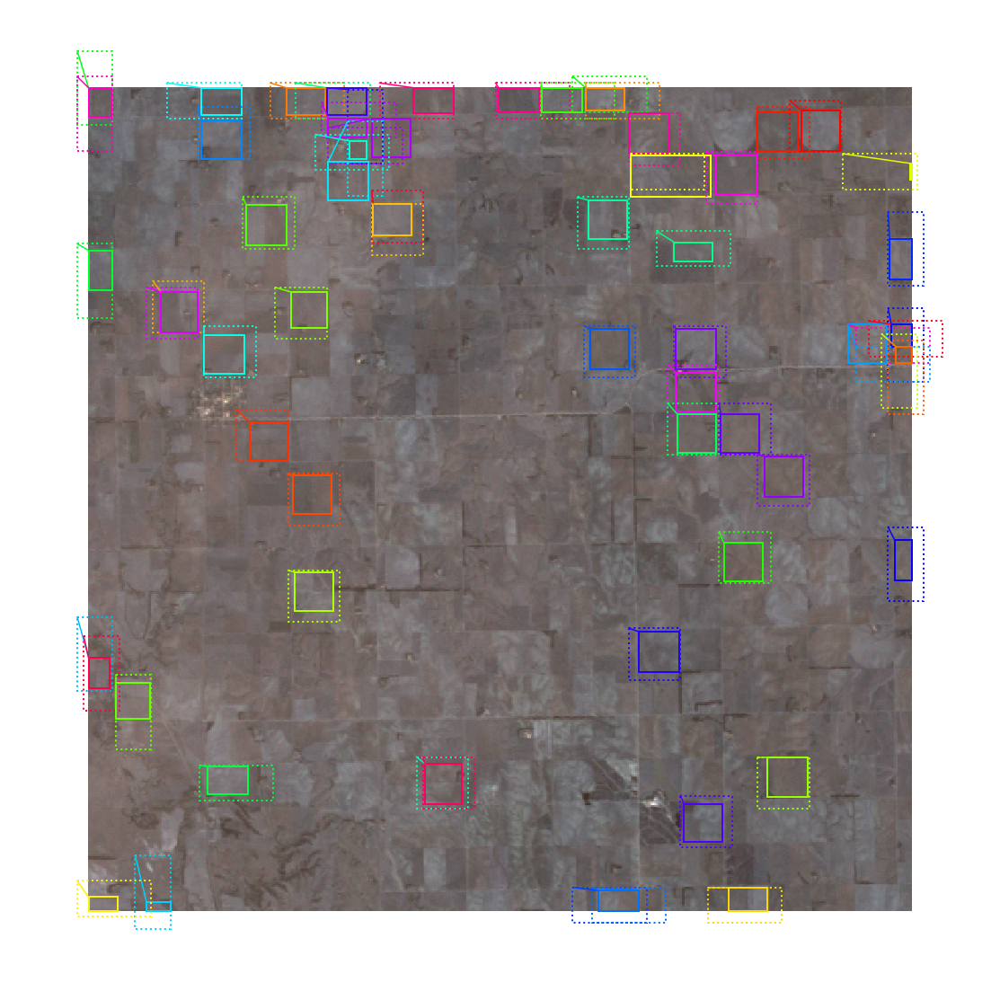

In [27]:
# Display positive anchors before refinement (dotted) and
# after refinement (solid).
visualize.draw_boxes(
    image, ax=get_ax(),
    boxes=positive_anchors,
    refined_boxes=refined_anchors)

### 1.b RPN Predictions

Here we run the RPN graph and display its predictions.

In [28]:
# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 introduces a new version of NMS. Search for both names to support TF 1.3 and 1.4
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV3:0")

rpn = model.run_graph(image[np.newaxis], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
], image_metas=image_meta[np.newaxis])

rpn_class                shape: (1, 65472, 2)         min:    0.00000  max:    1.00000  float32
pre_nms_anchors          shape: (1, 6000, 4)          min:   -0.03645  max:    1.03645  float32
refined_anchors          shape: (1, 6000, 4)          min:   -0.00868  max:    1.00892  float32
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max:    1.00000  float32
post_nms_anchor_ix       shape: (480,)                min:    0.00000  max: 5917.00000  int32
proposals                shape: (1, 2000, 4)          min:    0.00000  max:    1.00000  float32


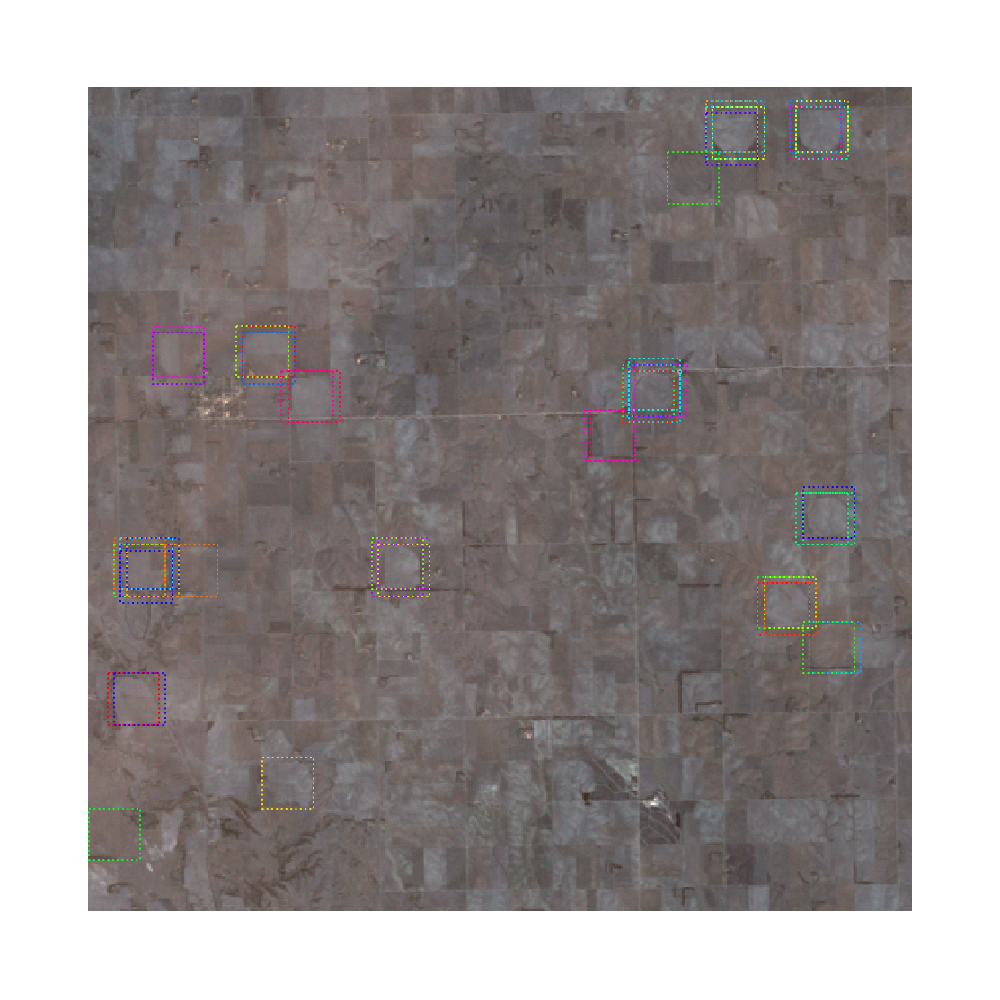

In [31]:
# Show top anchors by score (before refinement)
limit = 50
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=anchors[sorted_anchor_ids[:limit]], ax=get_ax())

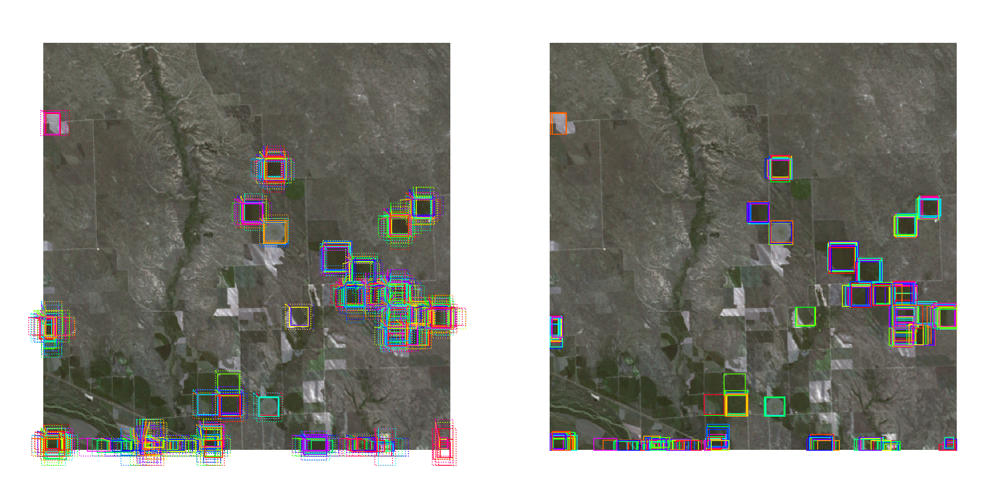

In [19]:
# Show top anchors with refinement. Then with clipping to image boundaries
limit = 500
ax = get_ax(1, 2)
visualize.draw_boxes(
    image, ax=ax[0],
    boxes=utils.denorm_boxes(rpn["pre_nms_anchors"][0, :limit], image.shape[:2]), 
    refined_boxes=utils.denorm_boxes(rpn["refined_anchors"][0, :limit], image.shape[:2]))
visualize.draw_boxes(
    image, ax=ax[1],
    refined_boxes=utils.denorm_boxes(rpn["refined_anchors_clipped"][0, :limit], image.shape[:2]))

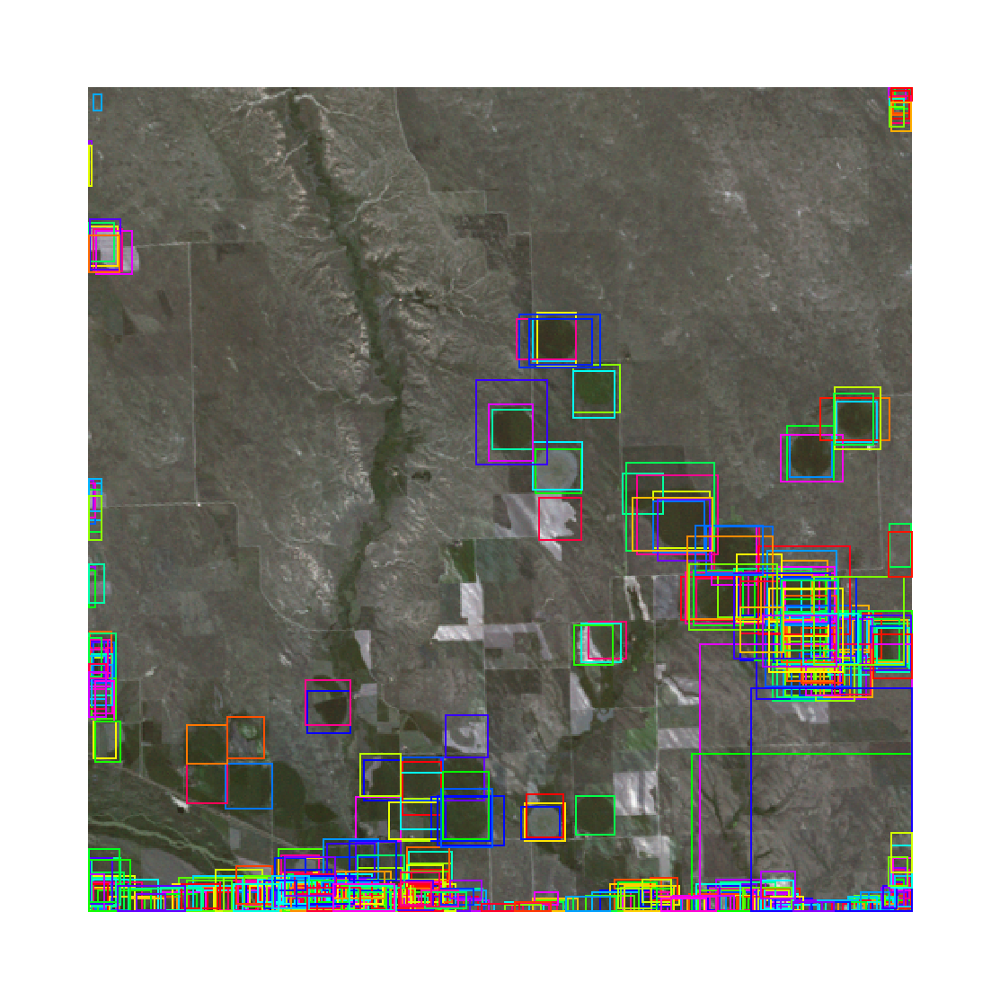

In [20]:
# Show refined anchors after non-max suppression
limit = 500
ixs = rpn["post_nms_anchor_ix"][:limit]
visualize.draw_boxes(
    image, ax=get_ax(),
    refined_boxes=utils.denorm_boxes(rpn["refined_anchors_clipped"][0, ixs], image.shape[:2]))

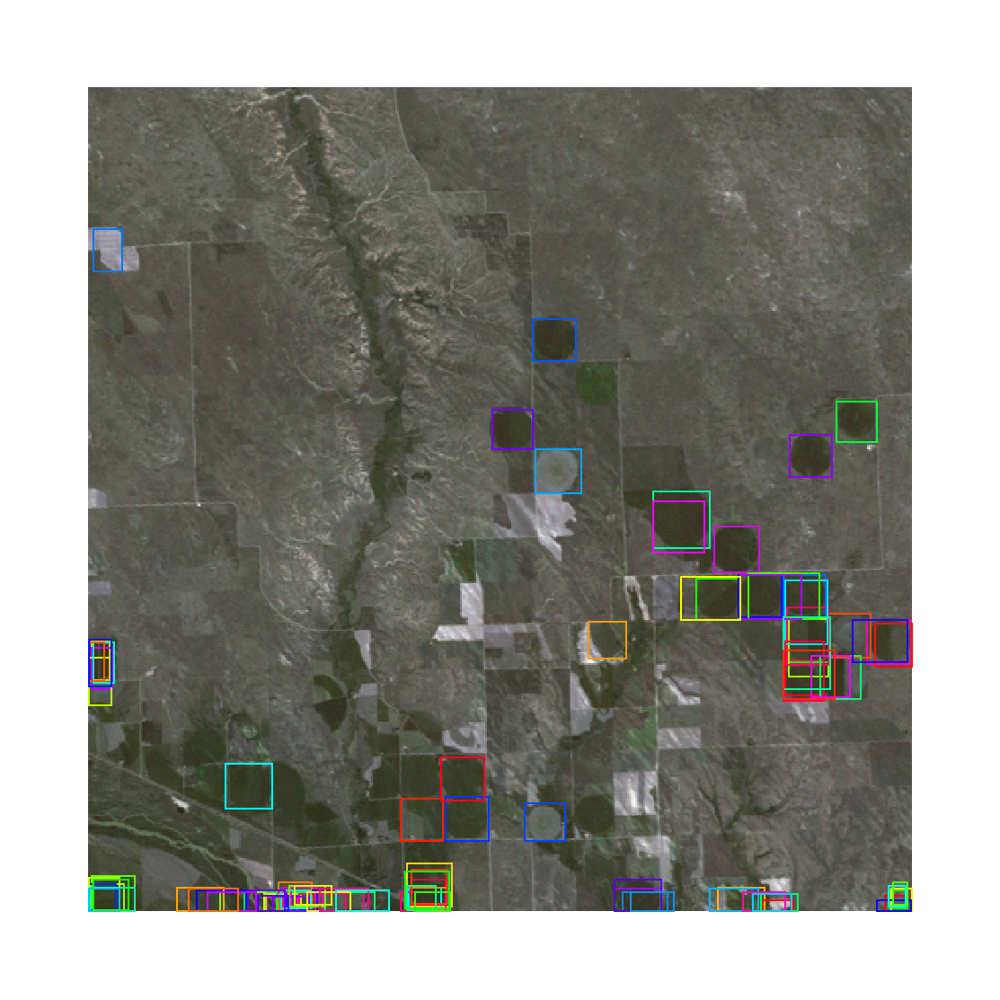

In [21]:
# Show final proposals
# These are the same as the previous step (refined anchors 
# after NMS) but with coordinates normalized to [0, 1] range.
limit = 100
# Convert back to image coordinates for display
h, w = config.IMAGE_SHAPE[:2]
proposals = rpn['proposals'][0, :limit] * np.array([h, w, h, w])
visualize.draw_boxes(
    image, ax=get_ax(),
    refined_boxes=utils.denorm_boxes(rpn['proposals'][0, :limit], image.shape[:2]))

## Stage 2: Proposal Classification

This stage takes the region proposals from the RPN and classifies them.

### 2.a Proposal Classification

Run the classifier heads on proposals to generate class propbabilities and bounding box regressions.

In [22]:
# Get input and output to classifier and mask heads.
mrcnn = model.run_graph([image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

proposals                shape: (1, 2000, 4)          min:    0.00000  max:    1.00000  float32
probs                    shape: (1, 2000, 2)          min:    0.00000  max:    1.00000  float32
deltas                   shape: (1, 2000, 2, 4)       min:   -3.83866  max:    4.12268  float32
masks                    shape: (1, 400, 28, 28, 2)   min:    0.00012  max:    1.00000  float32
detections               shape: (1, 400, 6)           min:    0.00000  max:    1.00000  float32


32 detections: ['center-pivot' 'center-pivot' 'center-pivot' 'center-pivot'
 'center-pivot' 'center-pivot' 'center-pivot' 'center-pivot'
 'center-pivot' 'center-pivot' 'center-pivot' 'center-pivot'
 'center-pivot' 'center-pivot' 'center-pivot' 'center-pivot'
 'center-pivot' 'center-pivot' 'center-pivot' 'center-pivot'
 'center-pivot' 'center-pivot' 'center-pivot' 'center-pivot'
 'center-pivot' 'center-pivot' 'center-pivot' 'center-pivot'
 'center-pivot' 'center-pivot' 'center-pivot' 'center-pivot']


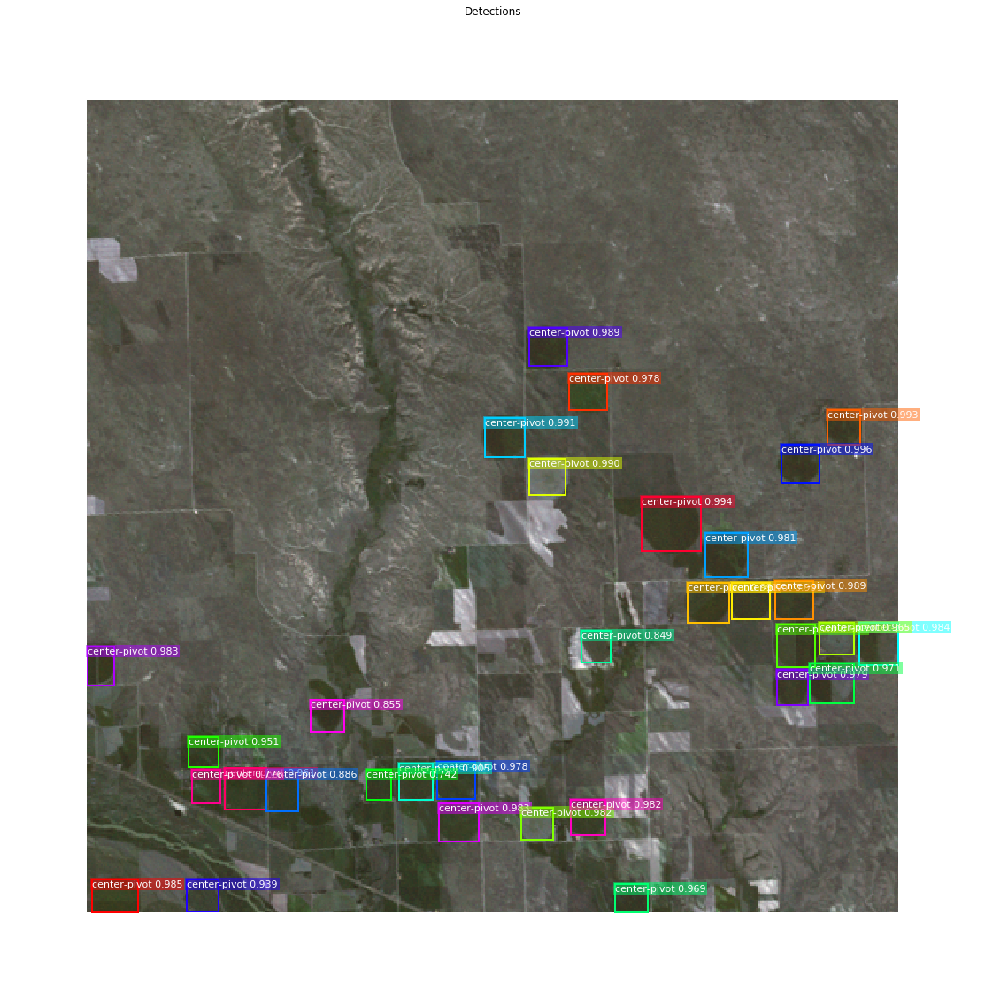

In [23]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]
visualize.draw_boxes(
    image, 
    refined_boxes=utils.denorm_boxes(detections[:, :4], image.shape[:2]),
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

### 2.c Step by Step Detection

Here we dive deeper into the process of processing the detections.

In [24]:
# Proposals are in normalized coordinates
proposals = mrcnn["proposals"][0]

# Class ID, score, and mask per proposal
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# How many ROIs vs empty rows?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Class counts
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

1594 Valid proposals out of 2000
237 Positive ROIs
[('BG', 1763), ('center-pivot', 237)]


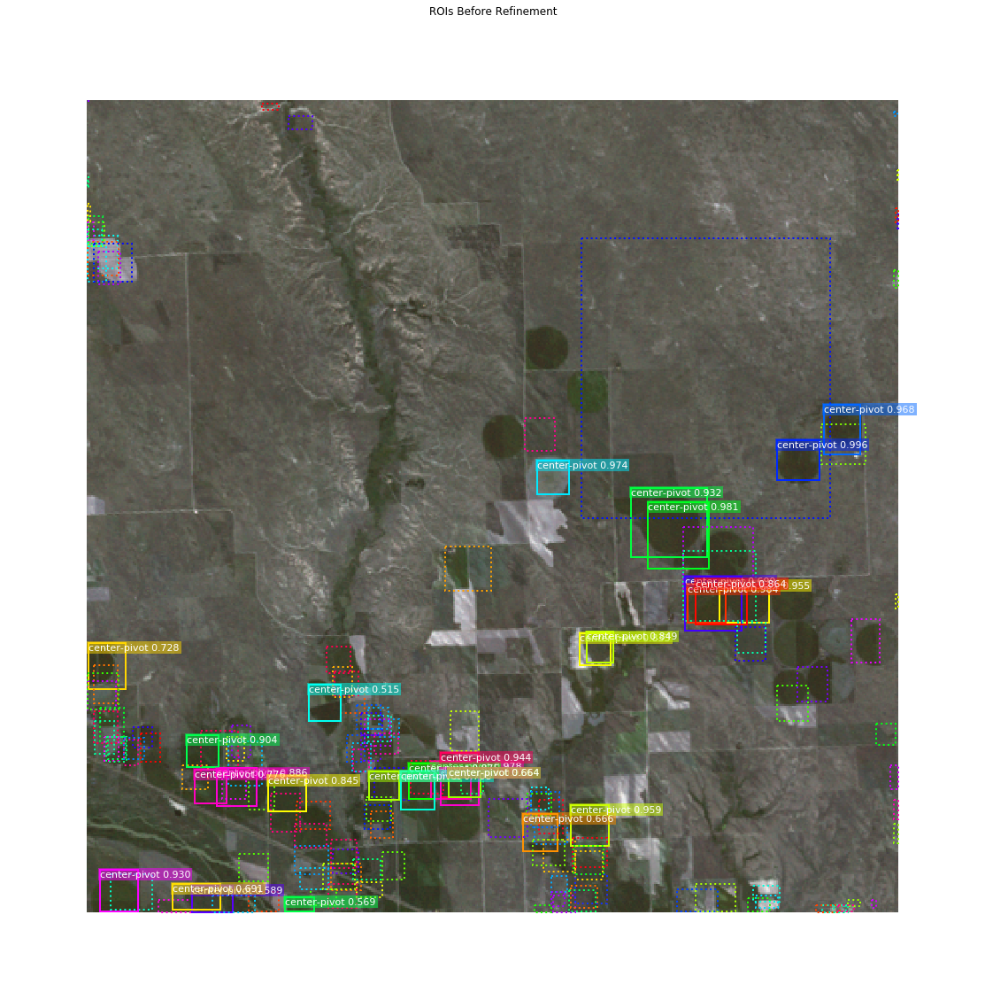

In [25]:
# Display a random sample of proposals.
# Proposals classified as background are dotted, and
# the rest show their class and confidence score.
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]
visualize.draw_boxes(
    image,
    boxes=utils.denorm_boxes(proposals[ixs], image.shape[:2]),
    visibilities=np.where(roi_class_ids[ixs] > 0, 2, 1),
    captions=captions, title="ROIs Before Refinement",
    ax=get_ax())

#### Apply Bounding Box Refinement

roi_bbox_specific        shape: (2000, 4)             min:   -2.80065  max:    4.12268  float32
refined_proposals        shape: (2000, 4)             min:   -0.00411  max:    1.03360  float32


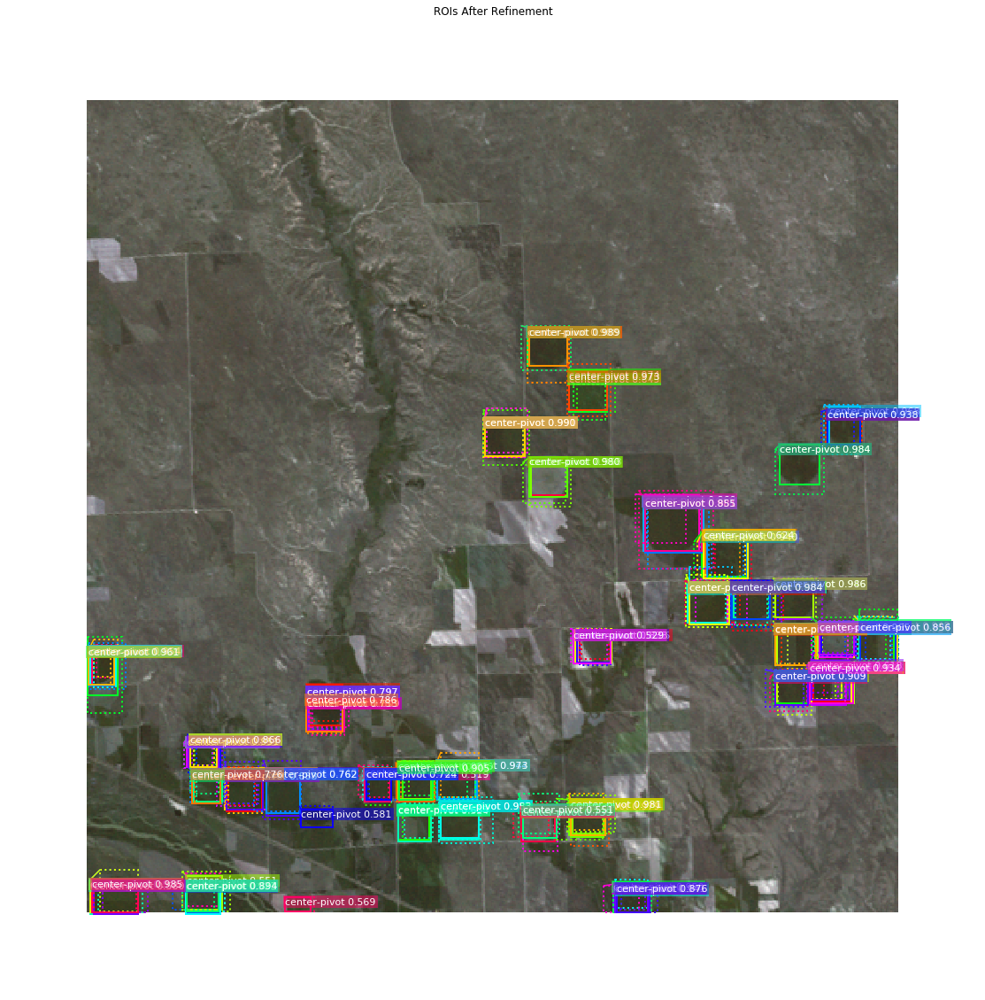

In [26]:
# Class-specific bounding box shifts.
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

# Apply bounding box transformations
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV)
log("refined_proposals", refined_proposals)

# Show positive proposals
# ids = np.arange(roi_boxes.shape[0])  # Display all
limit = 200
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
visualize.draw_boxes(
    image, ax=get_ax(),
    boxes=utils.denorm_boxes(proposals[roi_positive_ixs][ids], image.shape[:2]),
    refined_boxes=utils.denorm_boxes(refined_proposals[roi_positive_ixs][ids], image.shape[:2]),
    visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
    captions=captions, title="ROIs After Refinement")

#### Filter Low Confidence Detections

In [27]:
# Remove boxes classified as background
keep = np.where(roi_class_ids > 0)[0]
print("Keep {} detections:\n{}".format(keep.shape[0], keep))

Keep 237 detections:
[   0    1    2    3    4    5    6    7    8    9   10   11   12   13
   14   15   16   17   18   19   20   21   22   23   24   25   27   29
   32   33   35   37   38   39   41   42   44   48   49   50   51   52
   55   58   59   60   65   66   68   69   72   74   77   78   80   81
   85   86   87   88   91   93   96  101  104  106  107  108  109  110
  111  114  115  125  128  130  131  132  137  140  148  149  153  157
  162  165  169  174  179  181  182  183  185  191  199  202  213  214
  218  223  227  230  231  232  243  244  246  247  256  257  259  263
  273  277  280  291  293  294  298  300  301  312  313  314  325  327
  333  337  348  355  372  385  393  405  409  419  420  423  431  432
  438  441  448  452  463  471  492  495  499  512  515  518  520  541
  542  558  572  586  587  589  602  608  615  619  627  643  649  656
  668  675  677  685  689  698  704  732  748  766  769  794  795  798
  809  815  823  845  856  862  898  903  907  912  949 

In [28]:
# Remove low confidence detections
keep = np.intersect1d(keep, np.where(roi_scores >= config.DETECTION_MIN_CONFIDENCE)[0])
print("Remove boxes below {} confidence. Keep {}:\n{}".format(
    config.DETECTION_MIN_CONFIDENCE, keep.shape[0], keep))

Remove boxes below 0.7 confidence. Keep 190:
[   0    1    2    3    4    5    6    7    8    9   10   11   12   13
   14   15   16   17   18   19   20   21   23   24   25   27   29   32
   33   35   37   38   39   41   42   44   48   50   51   55   58   59
   60   65   66   69   72   74   77   78   80   81   85   86   87   88
   91   93   96  104  106  107  108  109  110  111  114  115  125  128
  131  137  140  148  153  157  162  165  169  179  181  182  183  185
  199  202  213  218  227  230  231  244  246  247  256  259  277  280
  291  294  298  300  301  313  314  325  333  348  355  372  385  393
  405  419  420  423  431  432  438  441  448  452  463  471  492  512
  518  520  542  558  572  586  587  589  602  608  615  619  627  643
  649  656  675  677  689  698  704  732  748  766  769  794  798  815
  823  845  898  907  949  965  971  998 1000 1045 1054 1073 1081 1146
 1157 1175 1177 1185 1235 1245 1271 1276 1284 1295 1298 1310 1324 1353
 1424 1431 1445 1453 1482 1488 1

#### Per-Class Non-Max Suppression

In [29]:
# Apply per-class non-max suppression
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
for class_id in np.unique(pre_nms_class_ids):
    # Pick detections of this class
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    # Apply NMS
    class_keep = utils.non_max_suppression(pre_nms_boxes[ixs], 
                                            pre_nms_scores[ixs],
                                            config.DETECTION_NMS_THRESHOLD)
    # Map indicies
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset.class_names[class_id][:20], 
                                   keep[ixs], class_keep))

keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

center-pivot          : [   0    1    2    3    4    5    6    7    8    9   10   11   12   13
   14   15   16   17   18   19   20   21   23   24   25   27   29   32
   33   35   37   38   39   41   42   44   48   50   51   55   58   59
   60   65   66   69   72   74   77   78   80   81   85   86   87   88
   91   93   96  104  106  107  108  109  110  111  114  115  125  128
  131  137  140  148  153  157  162  165  169  179  181  182  183  185
  199  202  213  218  227  230  231  244  246  247  256  259  277  280
  291  294  298  300  301  313  314  325  333  348  355  372  385  393
  405  419  420  423  431  432  438  441  448  452  463  471  492  512
  518  520  542  558  572  586  587  589  602  608  615  619  627  643
  649  656  675  677  689  698  704  732  748  766  769  794  798  815
  823  845  898  907  949  965  971  998 1000 1045 1054 1073 1081 1146
 1157 1175 1177 1185 1235 1245 1271 1276 1284 1295 1298 1310 1324 1353
 1424 1431 1445 1453 1482 1488 1541 1563] -> [1235  4

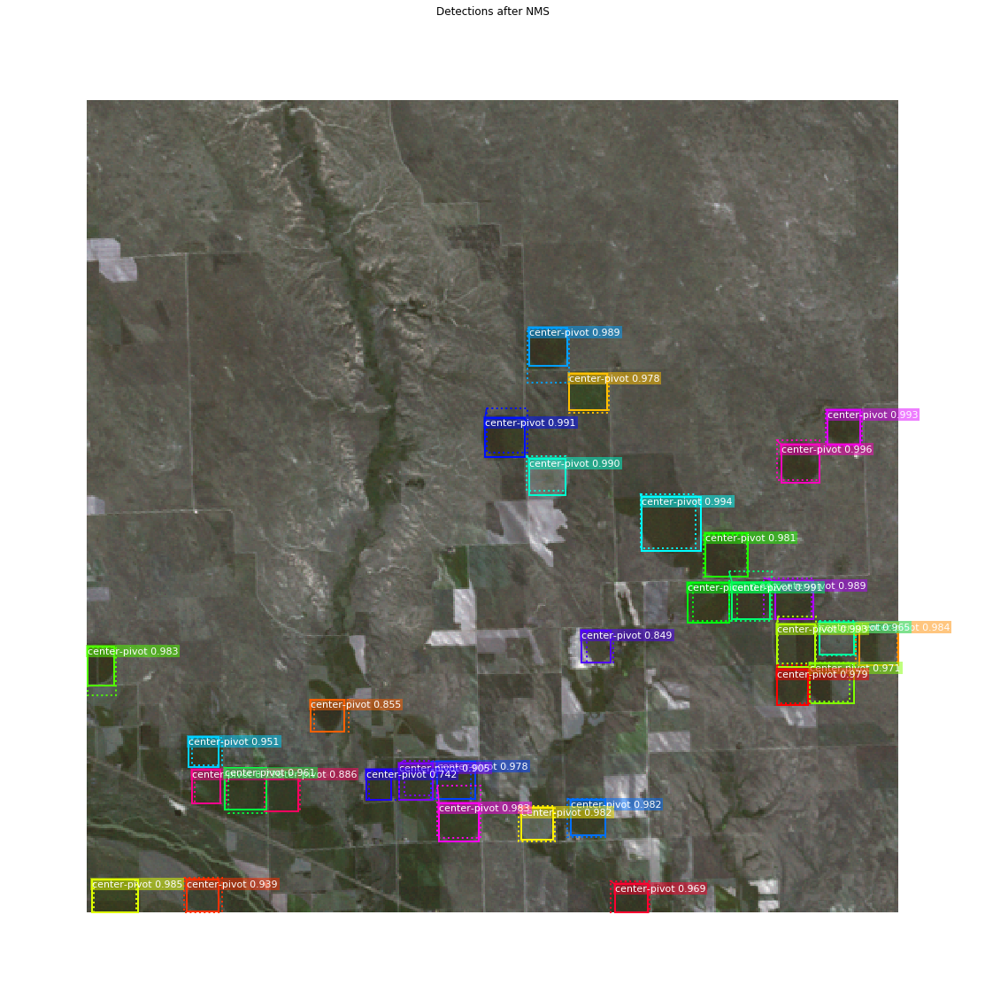

In [30]:
# Show final detections
ixs = np.arange(len(keep))  # Display all
# ixs = np.random.randint(0, len(keep), 10)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]
visualize.draw_boxes(
    image,
    boxes=utils.denorm_boxes(proposals[keep][ixs], image.shape[:2]),
    refined_boxes=utils.denorm_boxes(refined_proposals[keep][ixs], image.shape[:2]),
    visibilities=np.where(roi_class_ids[keep][ixs] > 0, 1, 0),
    captions=captions, title="Detections after NMS",
    ax=get_ax())

## Stage 3: Generating Masks

This stage takes the detections (refined bounding boxes and class IDs) from the previous layer and runs the mask head to generate segmentation masks for every instance.

### 3.a Mask Targets

These are the training targets for the mask branch

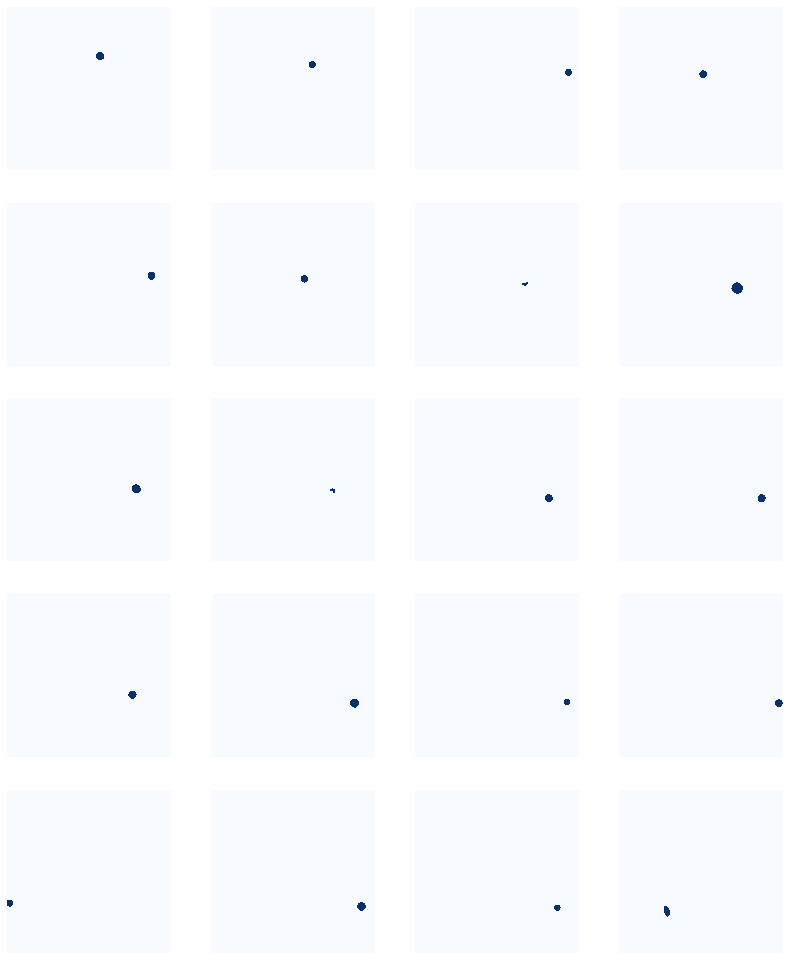

In [31]:
limit = 20
display_images(np.transpose(gt_mask[..., :limit], [2, 0, 1]), cmap="Blues")

### 3.b Predicted Masks

In [32]:
# Get predictions of mask head
mrcnn = model.run_graph([image], [
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
])

# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

detections               shape: (1, 400, 6)           min:    0.00000  max:    1.00000  float32
masks                    shape: (1, 400, 28, 28, 2)   min:    0.00012  max:    1.00000  float32
32 detections: ['center-pivot' 'center-pivot' 'center-pivot' 'center-pivot'
 'center-pivot' 'center-pivot' 'center-pivot' 'center-pivot'
 'center-pivot' 'center-pivot' 'center-pivot' 'center-pivot'
 'center-pivot' 'center-pivot' 'center-pivot' 'center-pivot'
 'center-pivot' 'center-pivot' 'center-pivot' 'center-pivot'
 'center-pivot' 'center-pivot' 'center-pivot' 'center-pivot'
 'center-pivot' 'center-pivot' 'center-pivot' 'center-pivot'
 'center-pivot' 'center-pivot' 'center-pivot' 'center-pivot']


In [33]:
# Masks
det_boxes = utils.denorm_boxes(mrcnn["detections"][0, :, :4], image.shape[:2])
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c] 
                              for i, c in enumerate(det_class_ids)])
det_masks = np.array([utils.unmold_mask(m, det_boxes[i], image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

det_mask_specific        shape: (32, 28, 28)          min:    0.00012  max:    1.00000  float32
det_masks                shape: (32, 512, 512)        min:    0.00000  max:    1.00000  bool


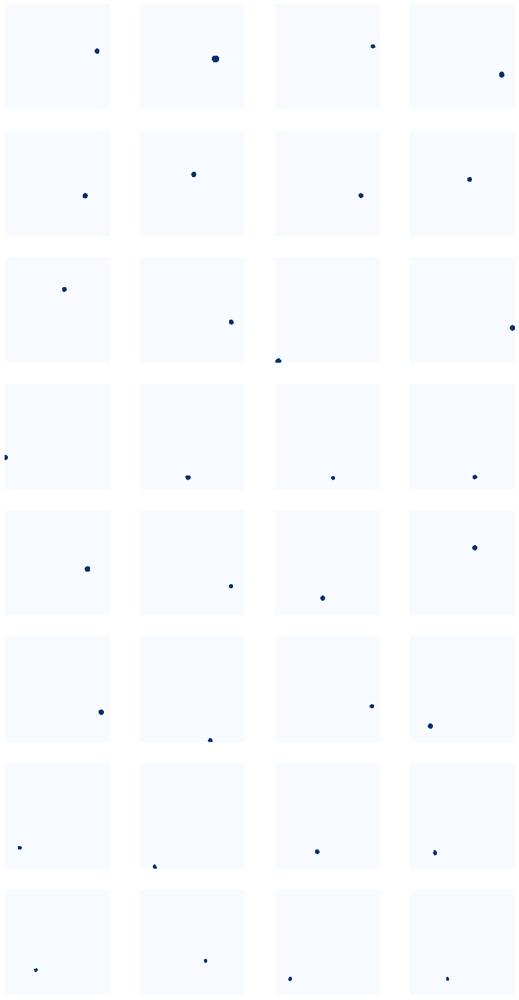

In [34]:
# display_images(det_mask_specific * 255, cmap="Blues", interpolation="none")
display_images(det_masks * 255, cmap="Blues", interpolation="none")

## Visualize Activations

In some cases it helps to look at the output from different layers and visualize them to catch issues and odd patterns.

In [35]:
# Get activations of a few sample layers
activations = model.run_graph([image], [
    ("input_image",        model.keras_model.get_layer("input_image").output),
    ("res2c_out",          model.keras_model.get_layer("res2c_out").output),
    ("res3c_out",          model.keras_model.get_layer("res3c_out").output),
    ("rpn_bbox",           model.keras_model.get_layer("rpn_bbox").output),
    ("roi",                model.keras_model.get_layer("ROI").output),
])

InvalidArgumentError: input_image:0 is both fed and fetched.

In [ ]:
activations['res2c_out']

In [ ]:
# Backbone featur map
display_images(np.transpose(activations["res2c_out"][0,:,:,:10], [2, 0, 1]), cols=1, save=True)